# Semantic Segmentation Models Benchmark

This notebook compares different configurations of the **SegFormer** model trained on the ForestSim dataset (24 semantic classes), with the goal of selecting the best configuration to use as the student/baseline network in the navigation pipeline.

For each model, the following are reported:
- **Training curves**: loss and metric trends on the train/validation sets;
- **Quantitative evaluation**: segmentation metrics (e.g. mIoU, per-class accuracy) and confusion matrix on the test set;
- **Qualitative evaluation**: visual examples of predictions on test images;
- **Performance benchmark**: model inference time and throughput.

The compared configurations vary in the **loss function** used during training (Dice + Cross-Entropy, Focal, Tversky).

In [ ]:
import pandas as pd
import torch

from dataset.dataloader import ForestDataLoader
from dataset.transforms import ForestTransforms

from models.segformer import SegFormer

from training.metrics import Metrics

from evaluation.training_plots import TrainingPlots
from evaluation.qualitative_evaluation import QualitativeEvaluation
from evaluation.quantitative_evaluation import QuantitativeEvaluation
from evaluation.benchmark import Benchmark
from evaluation.plots import Plots
from training.logger import Logger

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
test_transform = ForestTransforms(augmentation=False, train=False).get_transforms()
dataloader = ForestDataLoader(test_transform=test_transform)
dataloader.create_dataloaders()

print("Train:", len(dataloader.train_dataset))
print("Validation:", len(dataloader.validation_dataset))
print("Test:", len(dataloader.test_dataset))

Train: 1695
Validation: 189
Test: 209


In [4]:
metrics = Metrics(num_classes=24)

## SegFormer B1 — Dice + Cross-Entropy

**SegFormer B1** model (higher capacity than B0) trained with combined **Dice + Cross-Entropy** loss, to evaluate the impact of greater model capacity given the same loss function.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.549852,1.233457,0.00006,0.654834,0.133150,0.127459,0.114333,0.498648
1,2,1.113080,0.994285,0.00006,0.720421,0.147969,0.151166,0.133503,0.570106
2,3,0.956439,0.943230,0.00006,0.702264,0.167263,0.171147,0.152246,0.564147
3,4,0.859166,0.831462,0.00006,0.783799,0.205205,0.223061,0.192958,0.651338
4,5,0.812423,0.758639,0.00006,0.804964,0.208032,0.235195,0.202490,0.675387


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.442703,0.482056,0.000001,0.885923,0.400285,0.460822,0.401862,0.803386
146,147,0.439123,0.483283,0.000001,0.885028,0.404420,0.462046,0.401732,0.802333
147,148,0.437235,0.482090,0.000001,0.885429,0.402870,0.460292,0.401609,0.802826
148,149,0.442820,0.484558,0.000001,0.884135,0.402078,0.460156,0.400387,0.801009
149,150,0.439400,0.482168,0.000001,0.886019,0.400104,0.459424,0.400755,0.803436


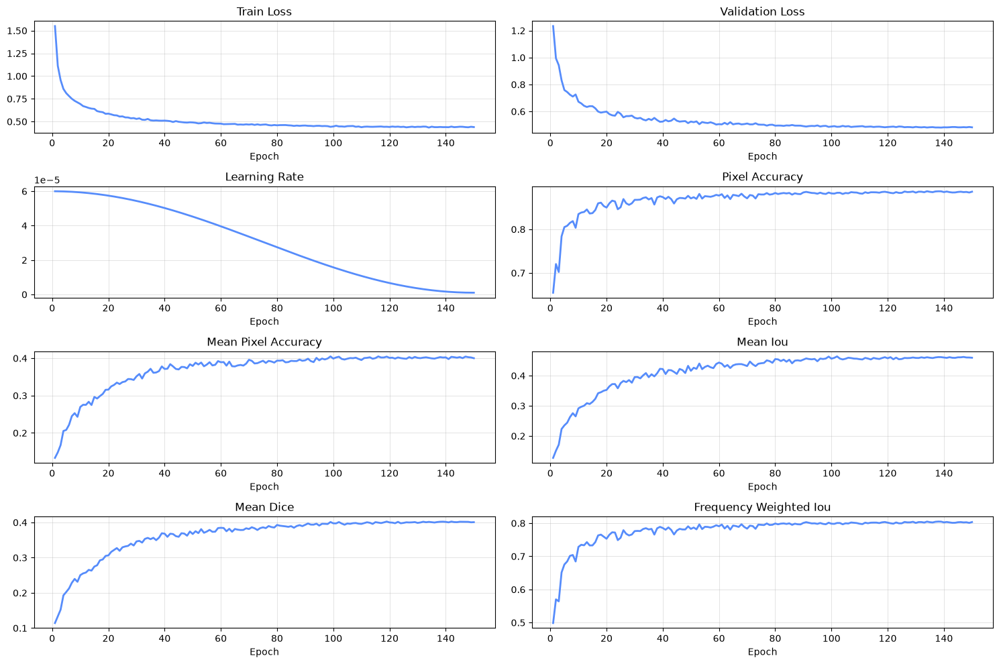

In [8]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8763
Mean Pixel Accuracy   : 0.3061
Mean IoU              : 0.4412
Mean Dice             : 0.3023
Frequency Weighted IoU: 0.7920

IoU per class:
Class 0: 0.6852
Class 1: 0.7776
Class 2: 0.3852
Class 3: 0.8718
Class 4: 0.8175
Class 5: 0.0000
Class 6: 0.3502
Class 7: 0.8655
Class 8: 0.7618
Class 9: 0.6558
Class 10: 0.6772
Class 11: 0.6335
Class 12: N/A
Class 13: N/A
Class 14: 0.6185
Class 15: 0.4407
Class 16: N/A
Class 17: 0.6535
Class 18: 0.5366
Class 19: 0.5139
Class 20: 0.0000
Class 21: 0.8108
Class 22: 0.6790
Class 23: 0.8515


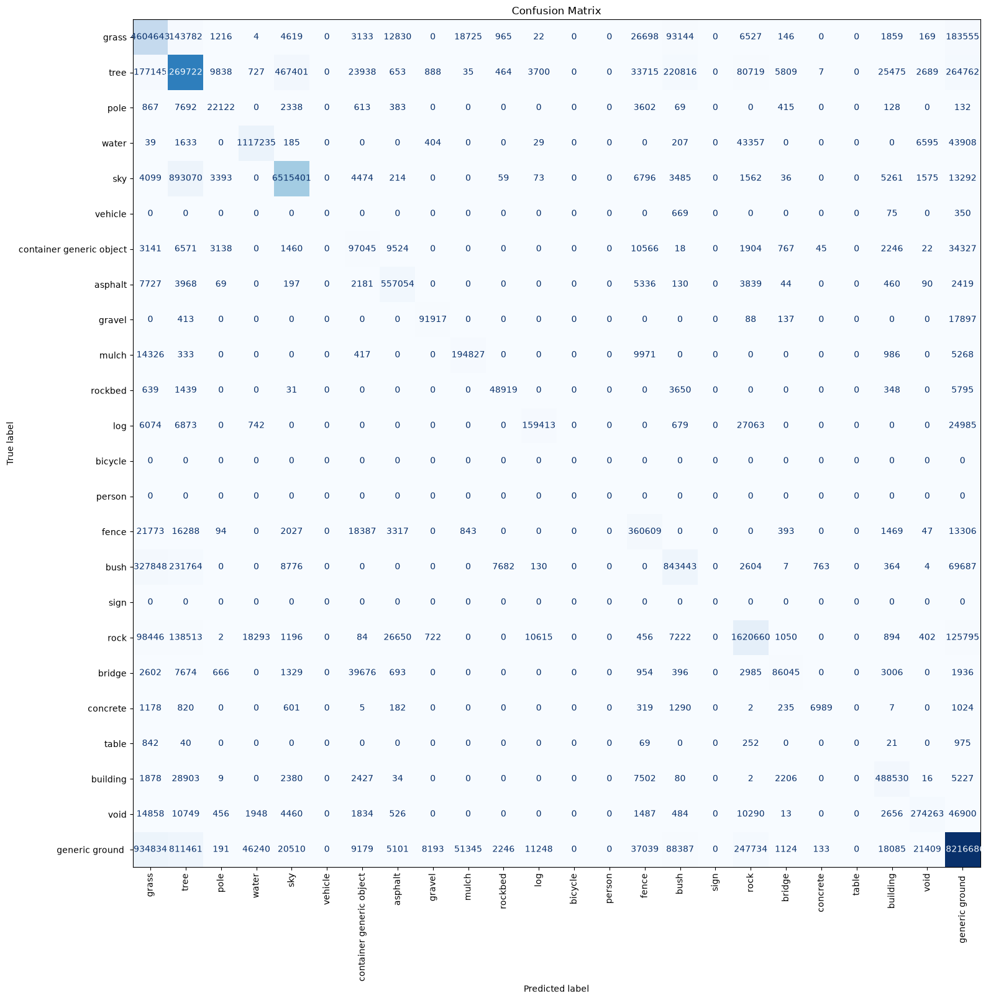

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

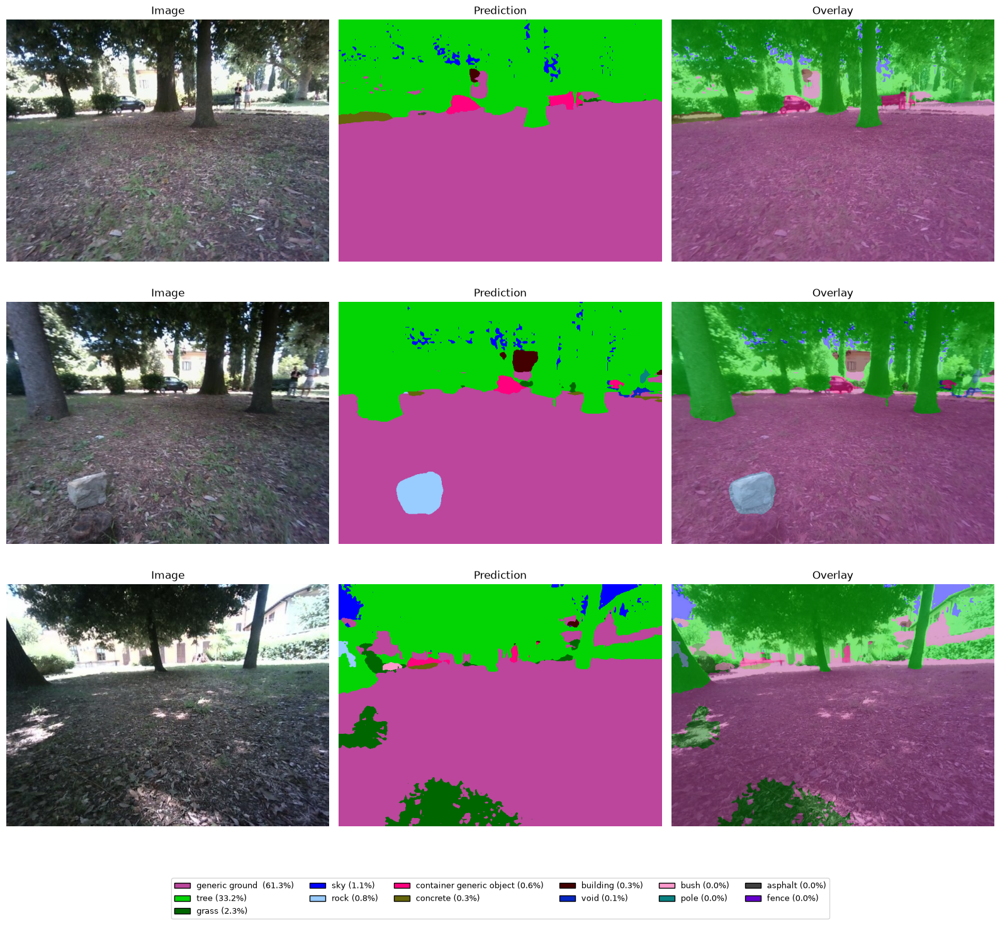

In [7]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

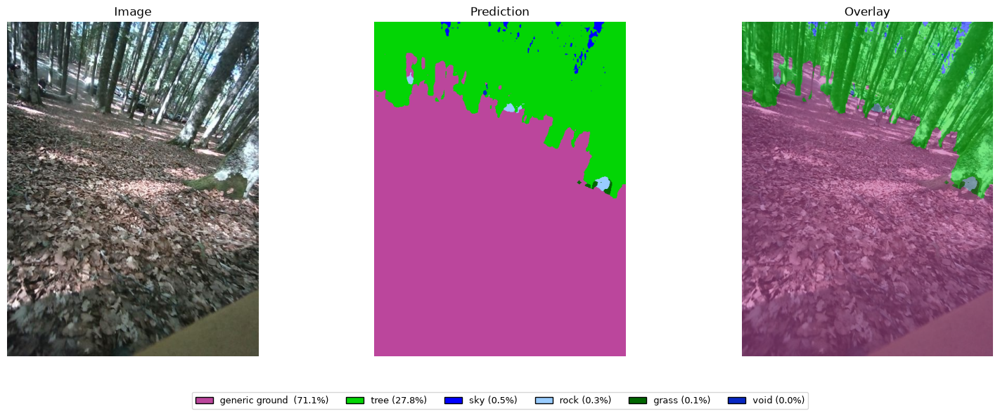

In [12]:
qualitative.evaluate_single(image_path="/tmp/pycharm_project_044d01a8/evaluation/test_images/vallombrosa2.jpg")

In [8]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.24
Throughput           : 665.91 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Focal

**SegFormer B1** model trained with **Focal** loss, to evaluate the impact of model capacity.

In [ ]:
model = SegFormer().get_model()

In [ ]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

In [ ]:
logs.tail()

In [ ]:
plots = TrainingPlots()

plots.plot_all()

In [ ]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()

In [ ]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

In [ ]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [ ]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)

## SegFormer B1 — Tversky

**SegFormer B1** model trained with **Tversky** loss, to evaluate the impact of model capacity given the loss function.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.949372,0.905783,0.00006,0.611385,0.144650,0.130426,0.123076,0.458119
1,2,0.887555,0.860707,0.00006,0.730975,0.177509,0.184438,0.164385,0.583414
2,3,0.847283,0.826998,0.00006,0.757358,0.217235,0.215784,0.191850,0.621205
3,4,0.818875,0.805155,0.00006,0.736283,0.241272,0.222424,0.201009,0.608746
4,5,0.795426,0.803288,0.00006,0.716883,0.240233,0.218586,0.199809,0.593443


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.612286,0.615567,0.000001,0.863175,0.403738,0.433831,0.381367,0.769943
146,147,0.608589,0.617260,0.000001,0.864562,0.399840,0.434410,0.381410,0.771300
147,148,0.612710,0.617152,0.000001,0.863896,0.399475,0.434756,0.381691,0.770451
148,149,0.598088,0.618764,0.000001,0.863258,0.397945,0.433672,0.380502,0.769496
149,150,0.611178,0.617197,0.000001,0.863097,0.400797,0.433603,0.380750,0.769596


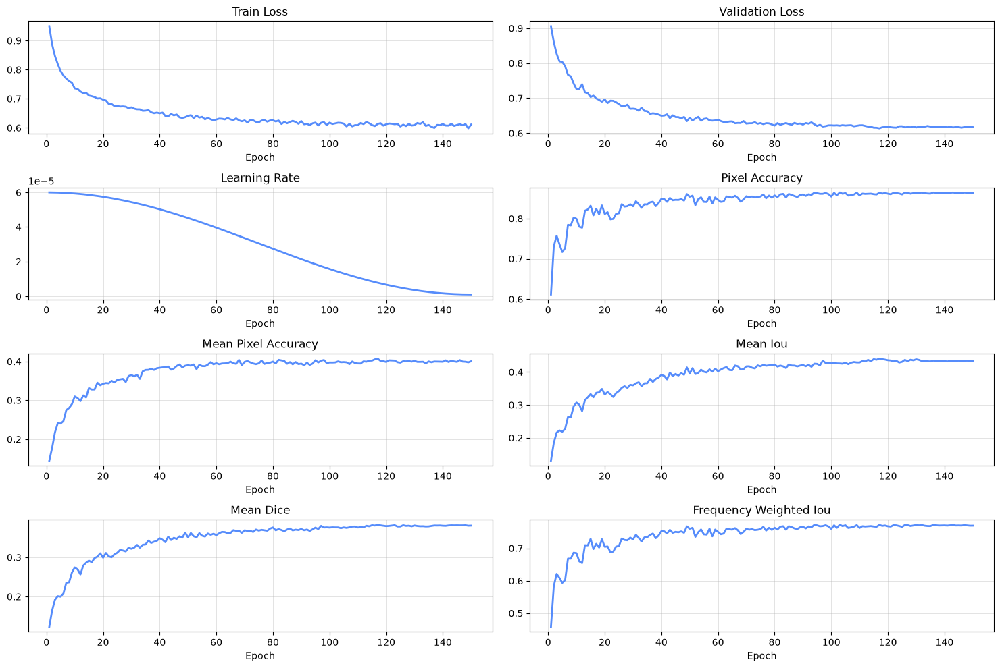

In [8]:
plots = TrainingPlots()

plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8521
Mean Pixel Accuracy   : 0.3102
Mean IoU              : 0.4141
Mean Dice             : 0.2941
Frequency Weighted IoU: 0.7583

IoU per class:
Class 0: 0.6380
Class 1: 0.7565
Class 2: 0.4270
Class 3: 0.8714
Class 4: 0.8115
Class 5: 0.0000
Class 6: 0.2800
Class 7: 0.8382
Class 8: 0.0000
Class 9: 0.0000
Class 10: 0.6437
Class 11: 0.6396
Class 12: N/A
Class 13: N/A
Class 14: 0.5205
Class 15: 0.4501
Class 16: N/A
Class 17: 0.6243
Class 18: 0.1272
Class 19: 0.3305
Class 20: 0.0000
Class 21: 0.7862
Class 22: 0.0411
Class 23: 0.8134


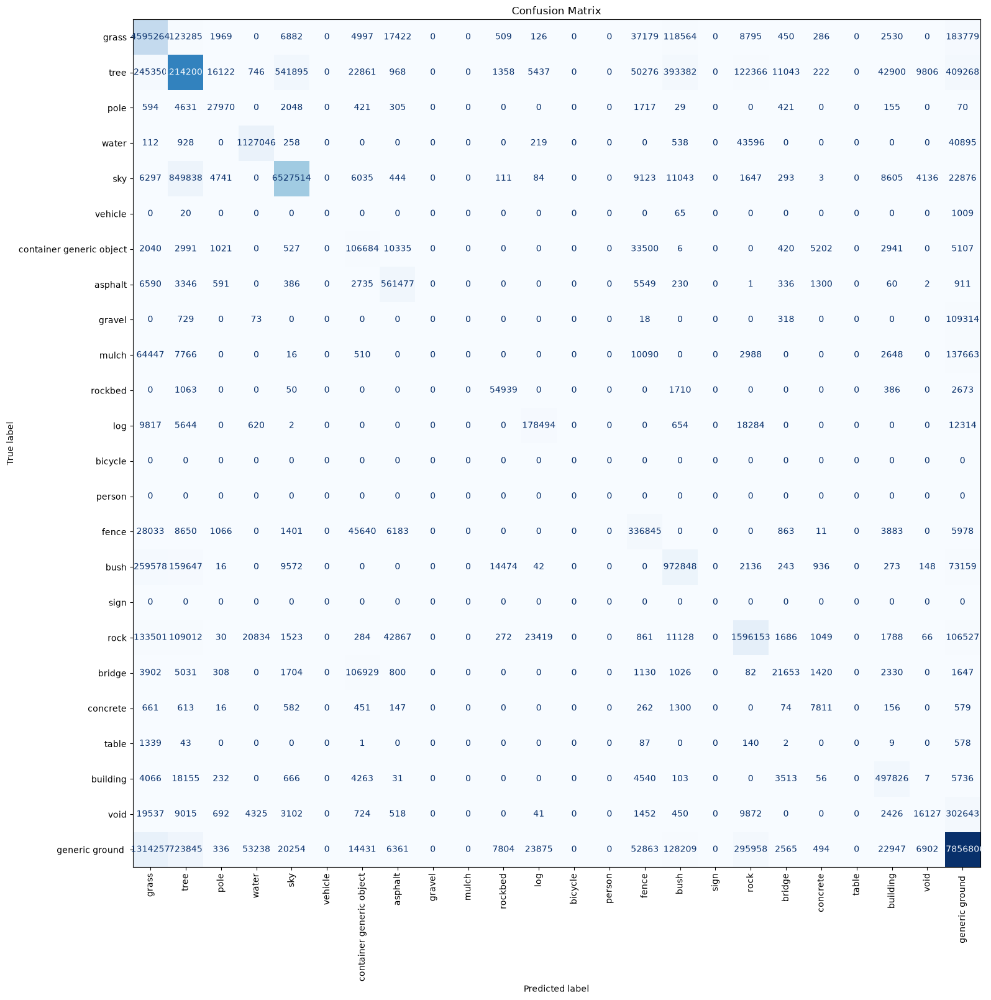

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

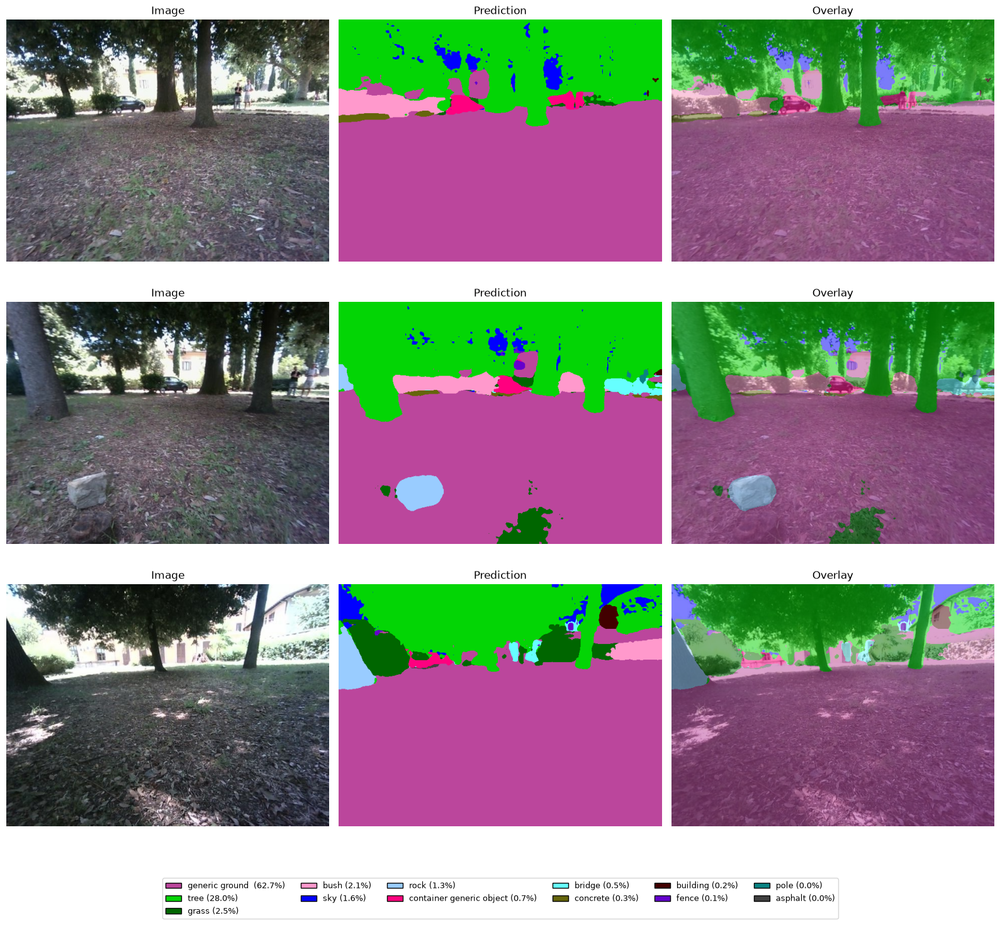

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

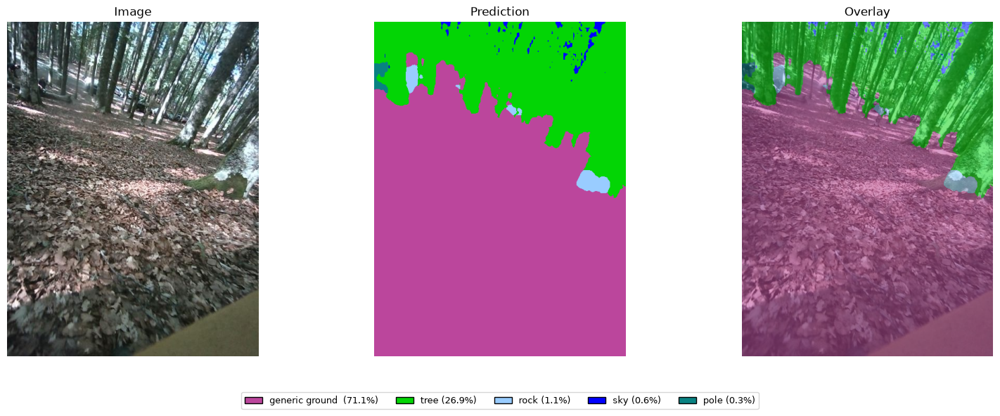

In [12]:
qualitative.evaluate_single(image_path="/tmp/pycharm_project_044d01a8/evaluation/test_images/vallombrosa2.jpg")

In [13]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.25
Throughput           : 665.99 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Dice

**SegFormer B1** model trained with **Dice** loss, to evaluate the impact of model capacity given the loss function.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.944012,0.904529,0.00006,0.561540,0.142780,0.132542,0.122831,0.429770
1,2,0.882576,0.871829,0.00006,0.667007,0.165685,0.164870,0.147810,0.529401
2,3,0.848790,0.834399,0.00006,0.764728,0.207972,0.218868,0.192066,0.632378
3,4,0.832868,0.823580,0.00006,0.764295,0.214326,0.220297,0.195568,0.633082
4,5,0.815739,0.795532,0.00006,0.782731,0.243744,0.249956,0.220400,0.659265


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.613802,0.614858,0.000001,0.872723,0.392895,0.433265,0.388351,0.783477
146,147,0.601283,0.614209,0.000001,0.872000,0.394748,0.435528,0.388931,0.782821
147,148,0.603917,0.614703,0.000001,0.872326,0.394044,0.430783,0.388695,0.783238
148,149,0.612992,0.615369,0.000001,0.871778,0.391875,0.432254,0.388253,0.782328
149,150,0.614355,0.615651,0.000001,0.871602,0.391261,0.429635,0.387814,0.782051


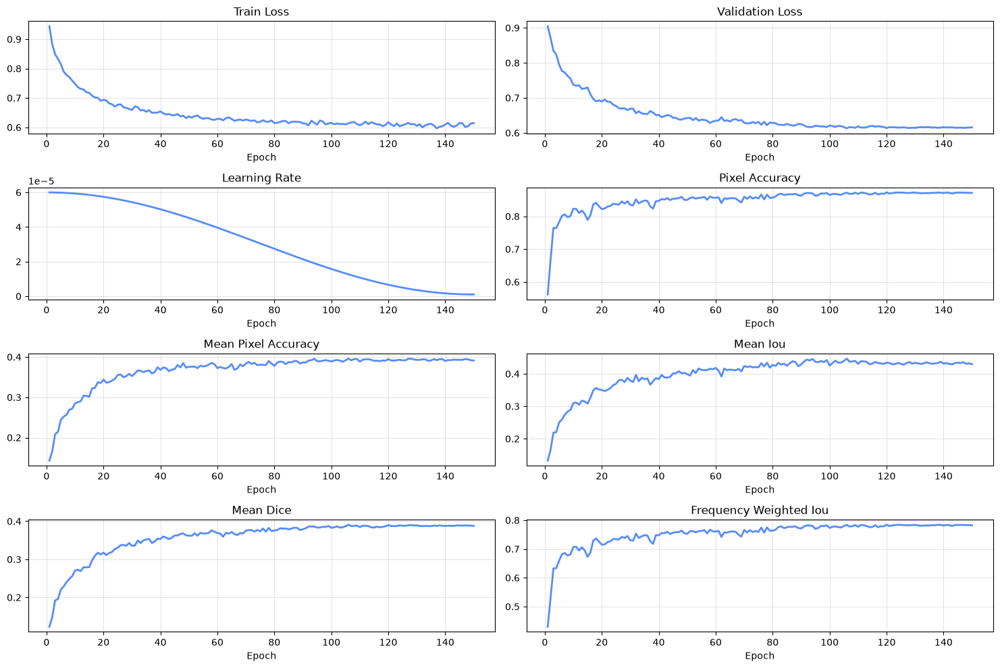

In [8]:
plots = TrainingPlots()

plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8579
Mean Pixel Accuracy   : 0.3013
Mean IoU              : 0.4128
Mean Dice             : 0.2966
Frequency Weighted IoU: 0.7665

IoU per class:
Class 0: 0.6543
Class 1: 0.7597
Class 2: 0.4346
Class 3: 0.8469
Class 4: 0.8098
Class 5: 0.0000
Class 6: 0.3114
Class 7: 0.8460
Class 8: 0.0000
Class 9: 0.6040
Class 10: 0.6747
Class 11: 0.6050
Class 12: N/A
Class 13: N/A
Class 14: 0.4608
Class 15: 0.4395
Class 16: N/A
Class 17: 0.6415
Class 18: 0.1070
Class 19: 0.4244
Class 20: 0.0307
Class 21: 0.8084
Class 22: 0.0407
Class 23: 0.8241


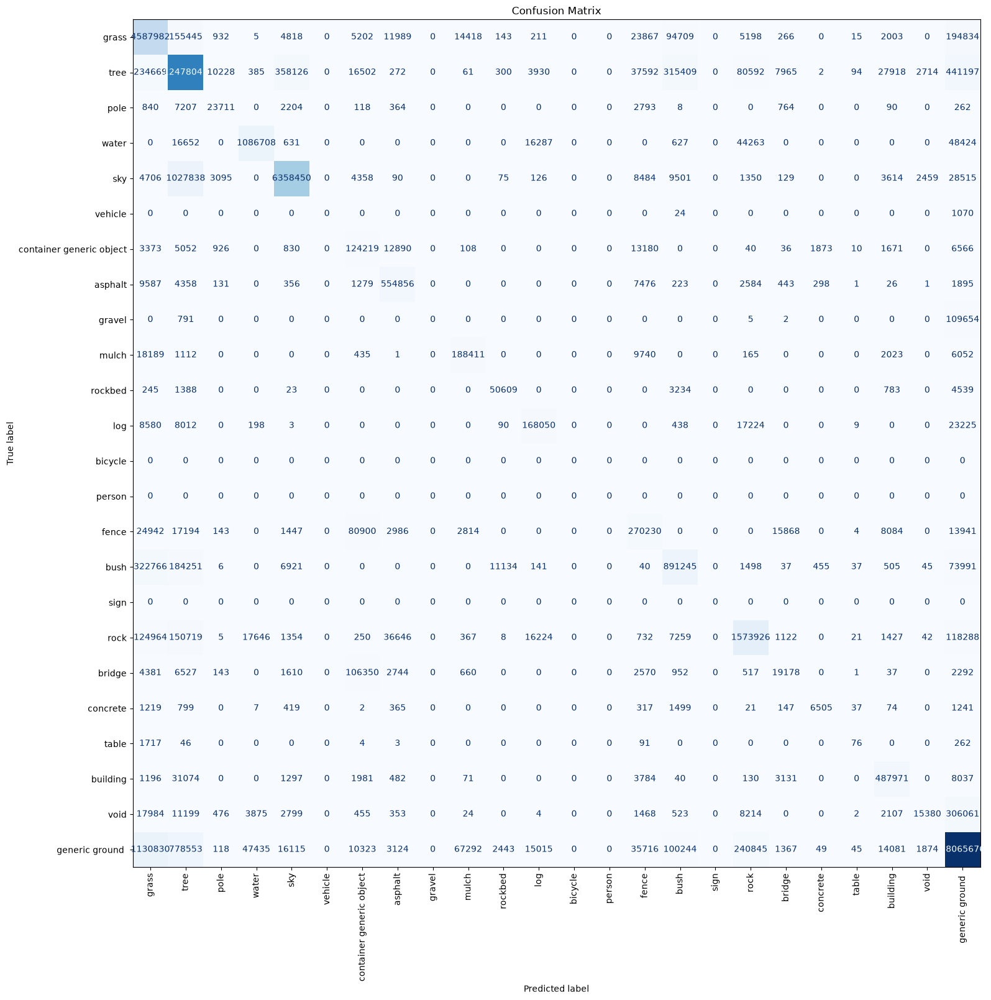

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

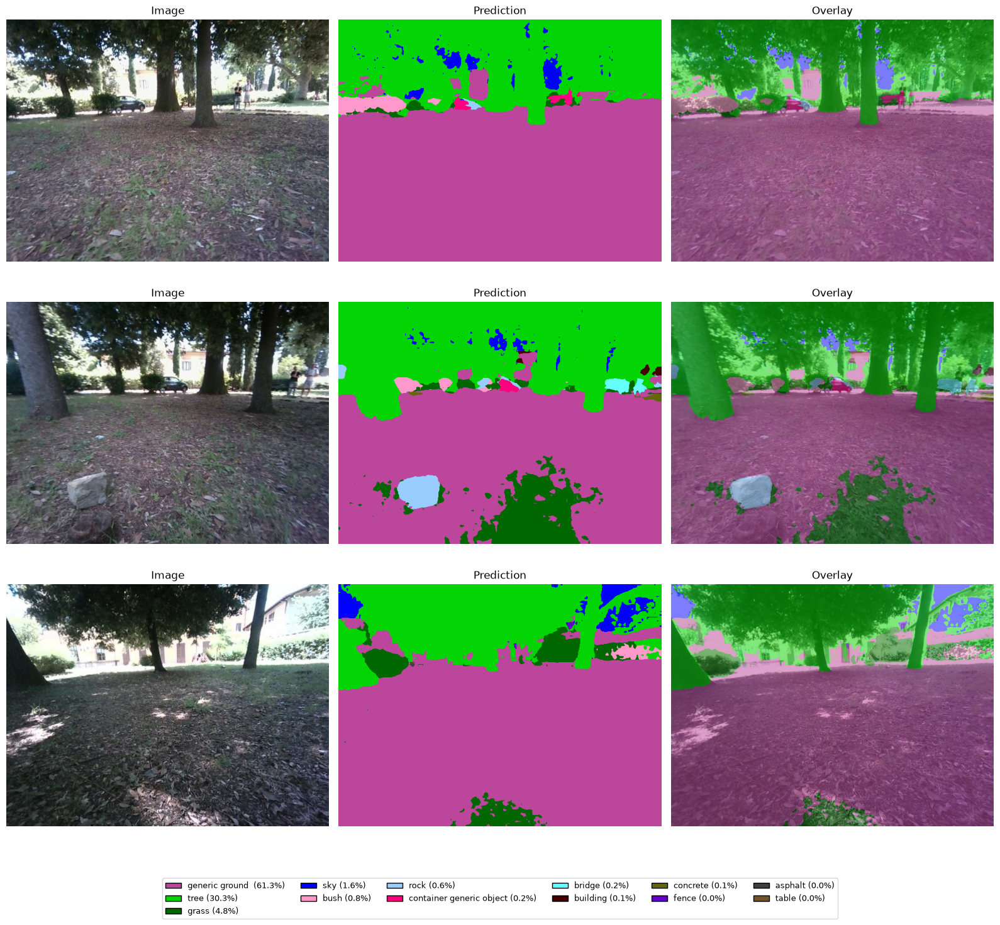

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

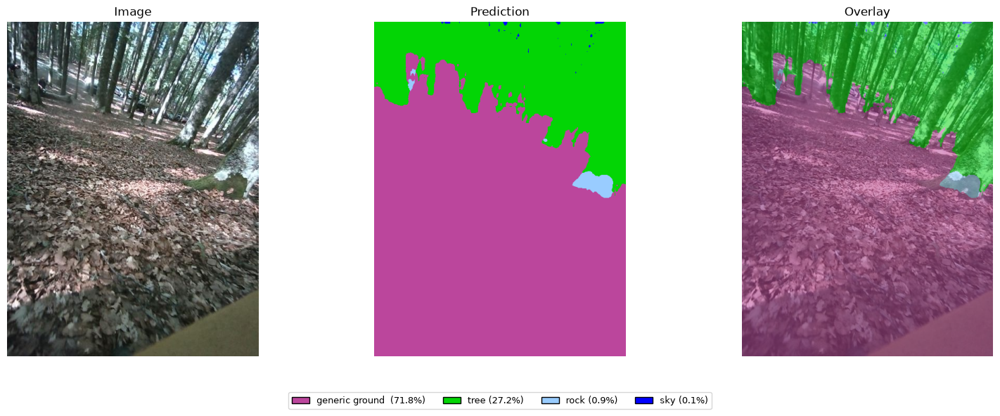

In [12]:
qualitative.evaluate_single(image_path="/tmp/pycharm_project_044d01a8/evaluation/test_images/vallombrosa2.jpg")

In [11]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.27
Throughput           : 666.20 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB
